<a href="https://colab.research.google.com/github/MichalRozenwald/Algorithms/blob/master/pymol_hw_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Задание
0. Поработайте в PyMOL с записью 1LMP банка PDB. Суть задания состоит в поэтапном освоении возможностей PyMol как пакета для моделирования.

1. Оцените возможности Sculpting, в Wizard->Demo->Sculpting

2. Используюя select within найдите водородные связи которыми белок связывает лиганд. Опишите эти возможные другие взаимодействия белка с лигандом. Попробуйте поискать альтернативный способ поиска водородных связей.

3. Средствами Tcl/Tk интерфейса Wizard->Mutagenesis проведите мутацию в белке, которая по вашему мнению должна привести к потере связывания с лигандом.

4. Используя команды mset, mview, super, translate создайте анимационный ролик mpeg где происходит совмещение белков и показывается место мутации. Обратите внимание на указания в object motions на http://www.pymolwiki.org pymolwiki.

5. Приседените флуорусцентную метку TAMRA к белку через сложноэфирную связь. Используйте команды fuse и torsion.


6. Напишите скрипт для построения поли-аланиновой ( Вы вольны использовать любую аминоксилоту) альфа спирали длинной 100 аминкислот. Псевдо-код вы можете найти в подсказках.



## 0. Поработайте в PyMOL с записью 1LMP банка PDB. 

# 1LMP
THE CRYSTAL STRUCTURES OF THREE COMPLEXES BETWEEN CHITOOLIGOSACCHARIDES AND LYSOZYME FROM THE RAINBOW TROUT

Classification: HYDROLASE (O-GLYCOSYL)
Organism(s): Oncorhynchus mykiss

DOI: 10.2210/pdb1LMP/pdb

https://www.rcsb.org/structure/1LMP 

In [ ]:
fetch 1lmp

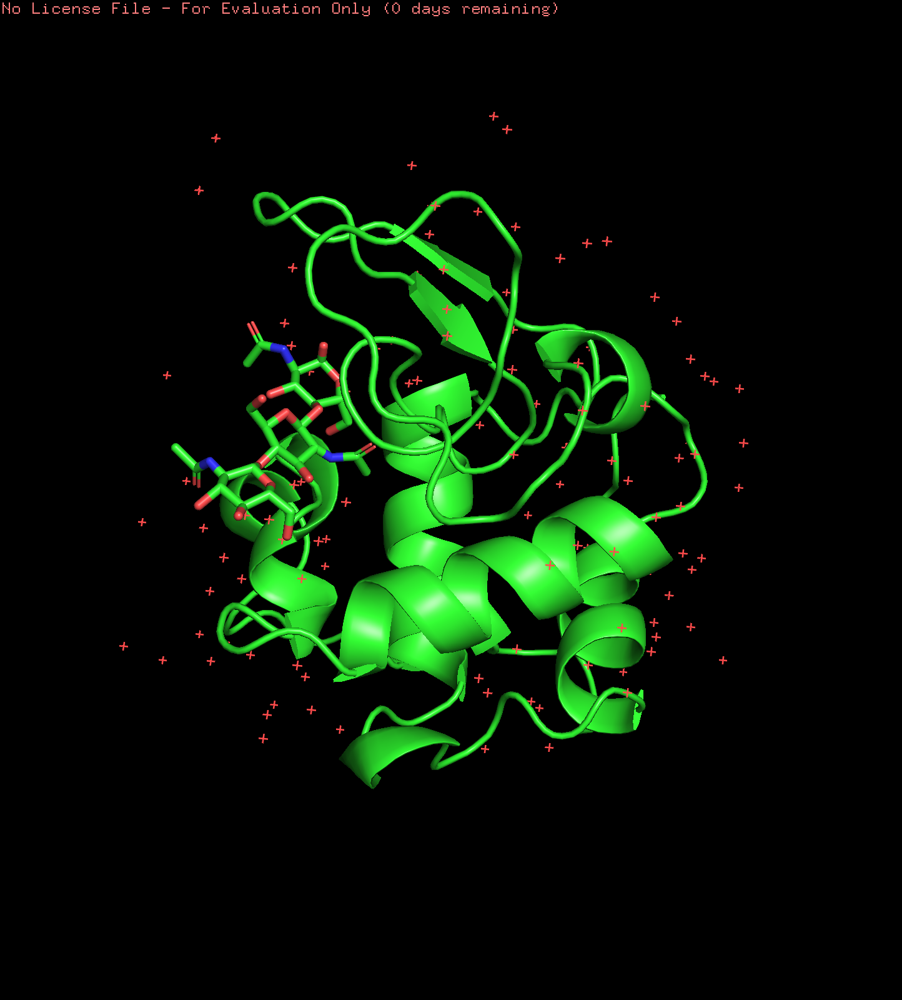

1lmp_load_2.png

## 1. Оцените возможности Sculpting, в Wizard->Demo->Sculpting

В результате использования Sculpting получаем красивые изображения структуры белка


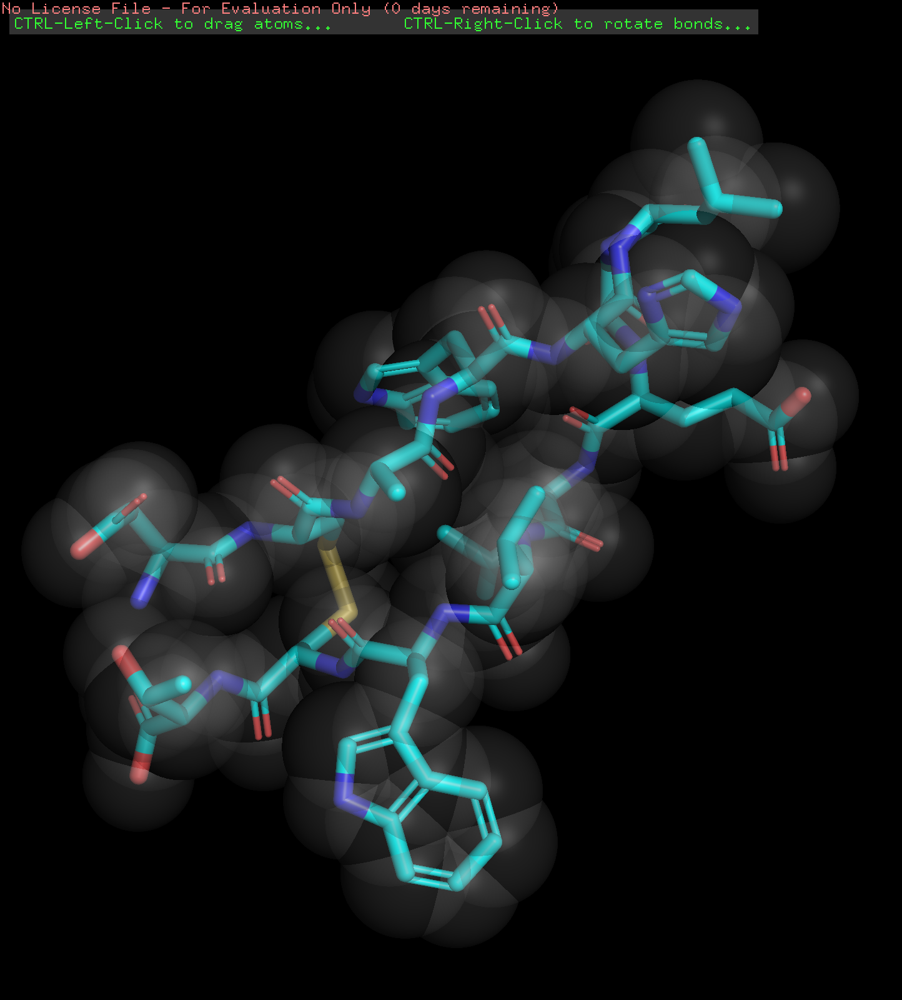

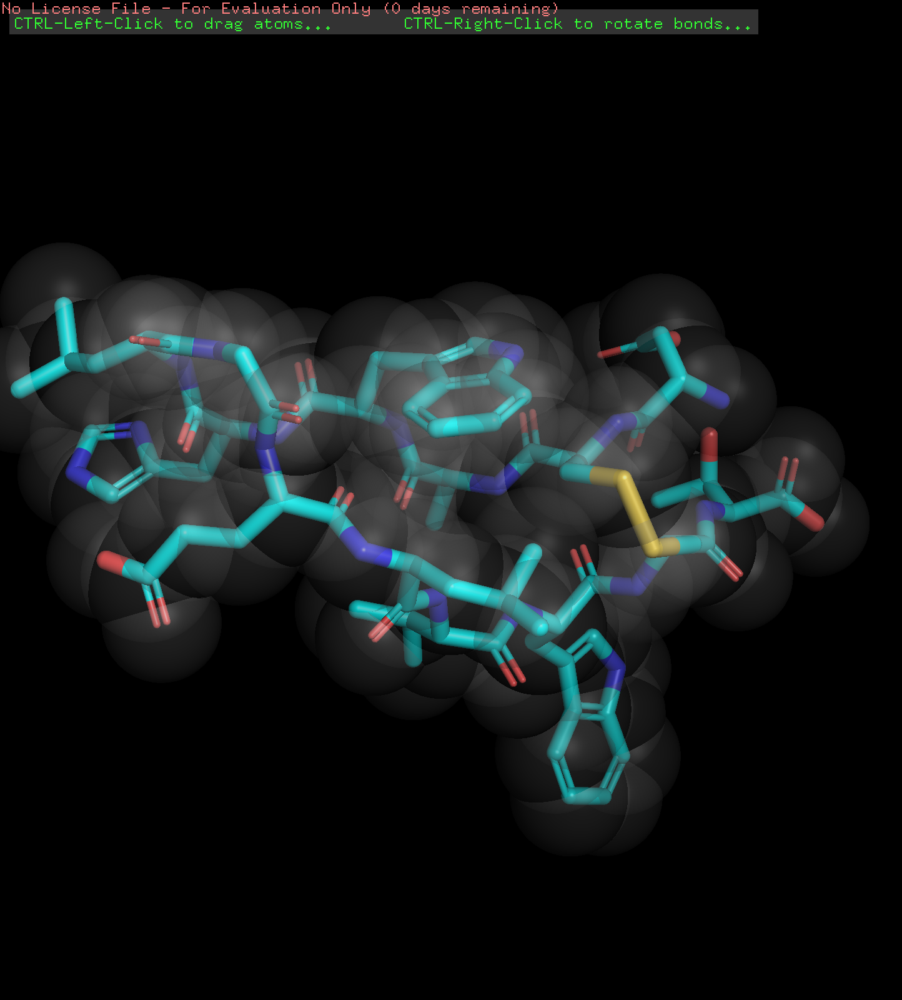

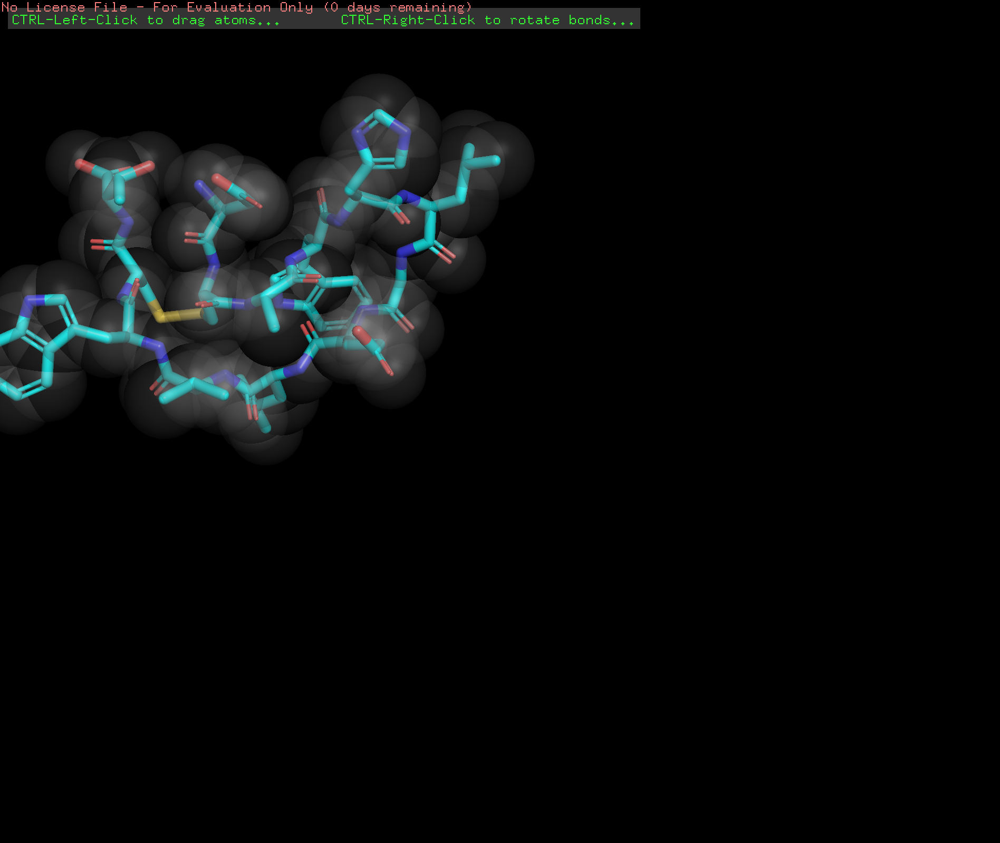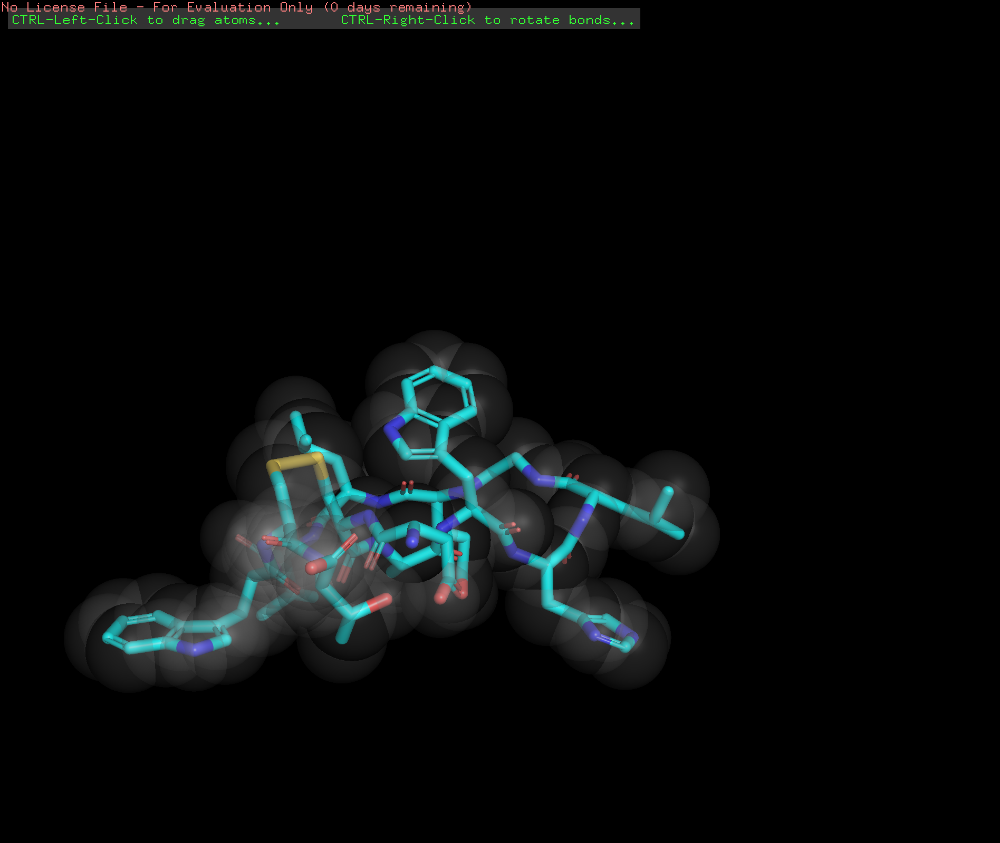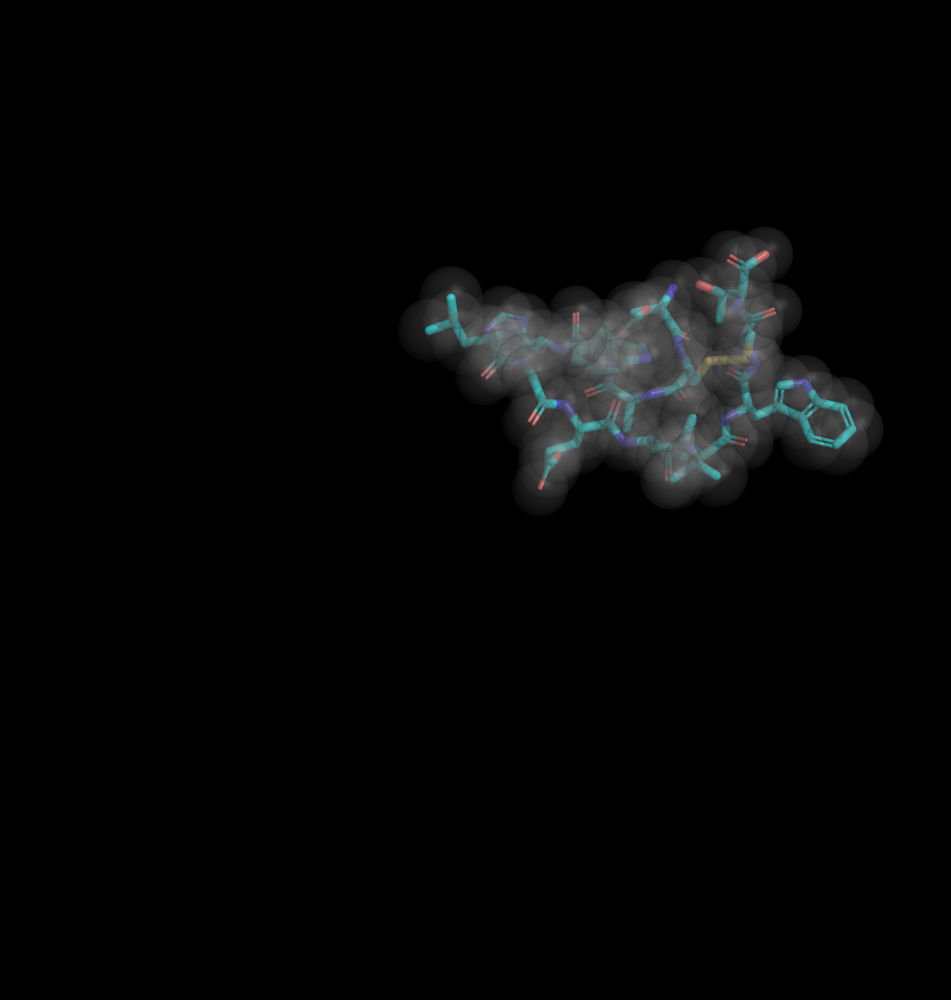


## 2. Используюя select within найдите водородные связи которыми белок связывает лиганд. Опишите эти возможные другие взаимодействия белка с лигандом. Попробуйте поискать альтернативный способ поиска водородных связей.

В первую очередь удалим молекулы воды.



In [ ]:
Код для pymol:


extract water, resn HOH
delete water

In [ ]:
center
zoom
ray 500,500

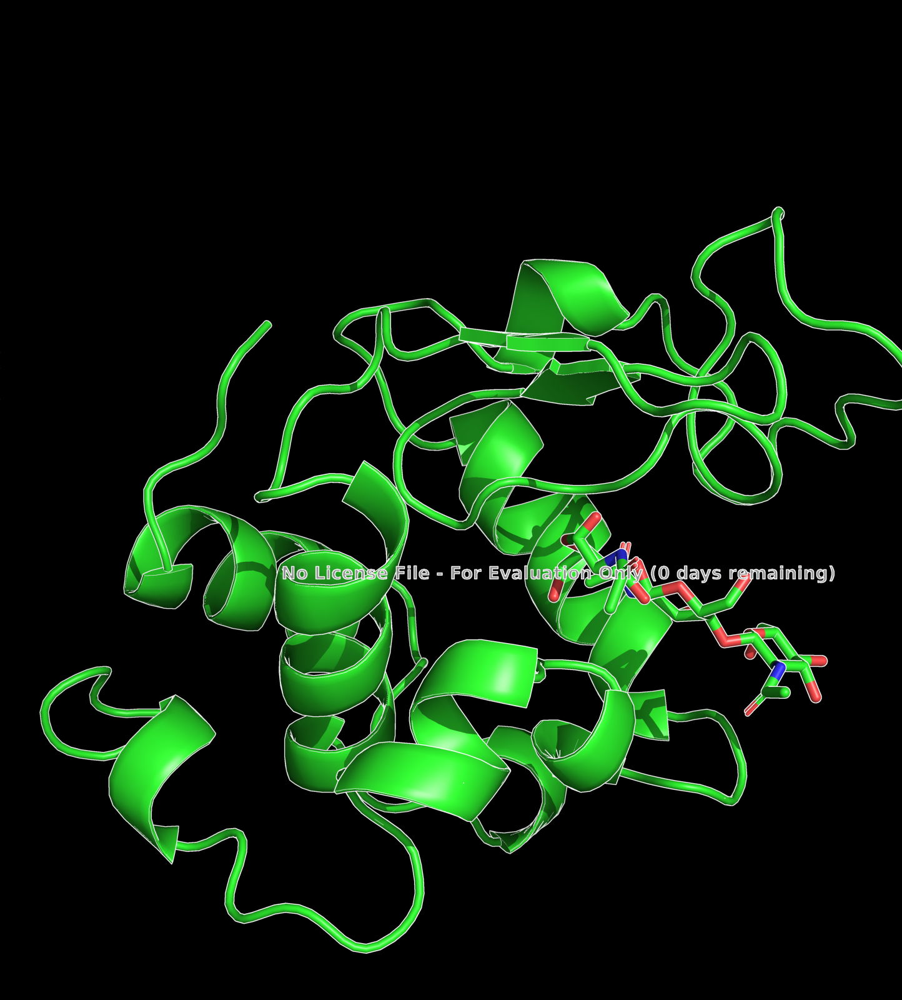

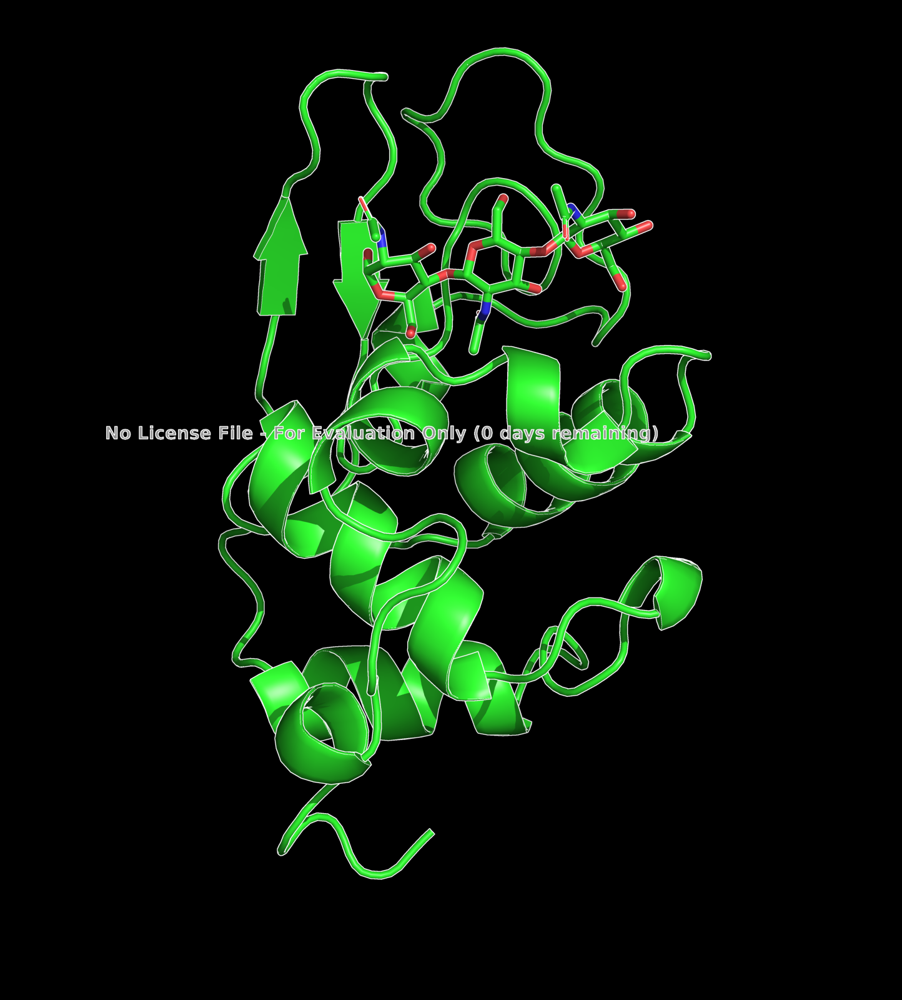

Выделим лиганд отдельным select-ом.

И раскрасим белок

In [ ]:
select ligand, resn NAG+NDG

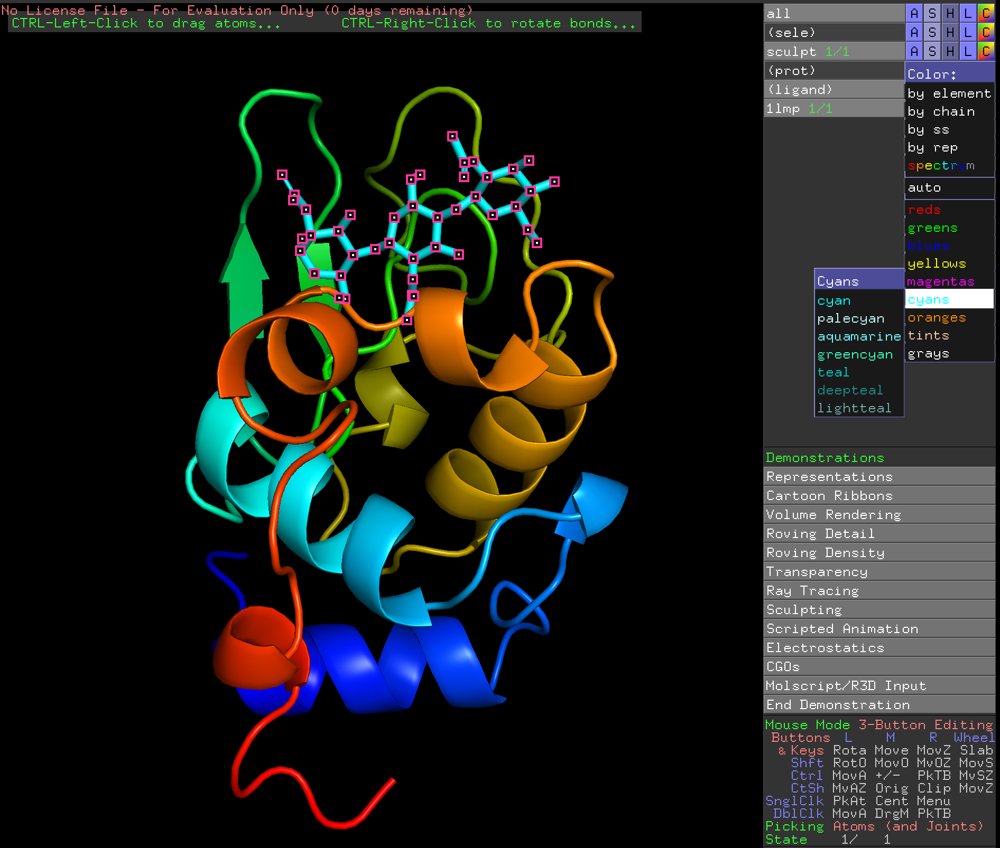

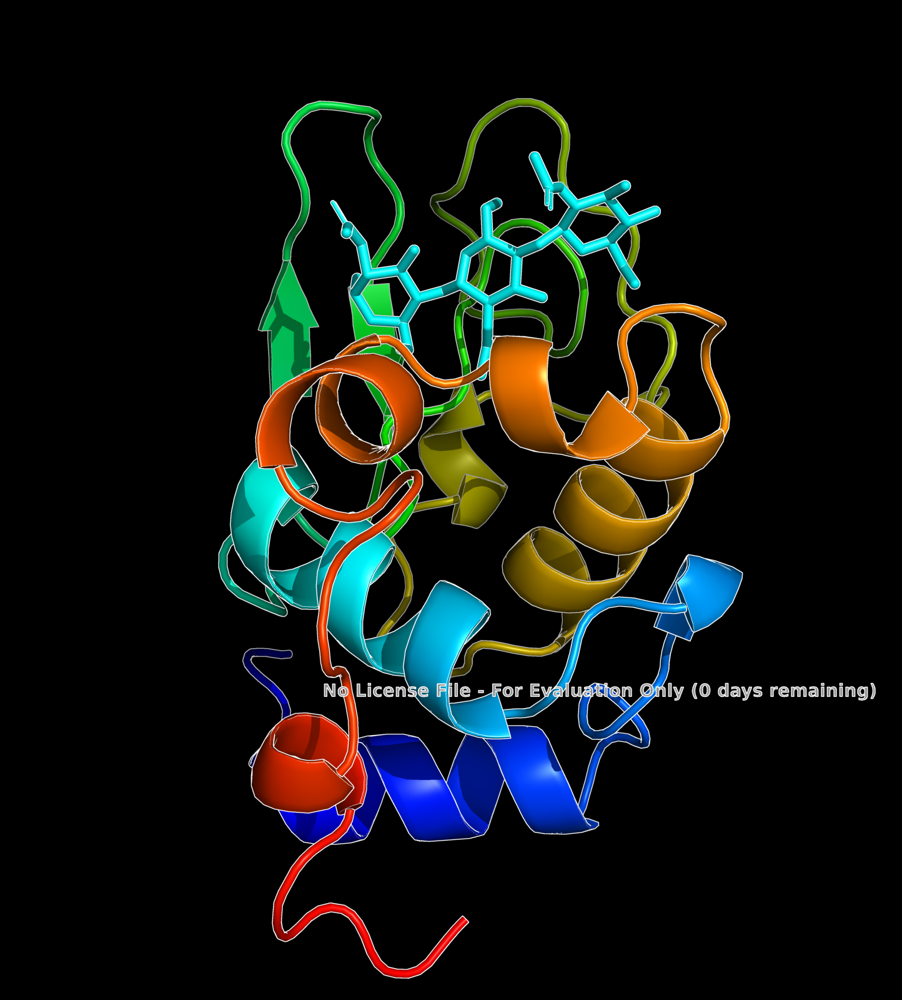

In [ ]:
Поищем водородные связи

 select contacts, byres prot within 3.2 of ligand
 show lines, contacts

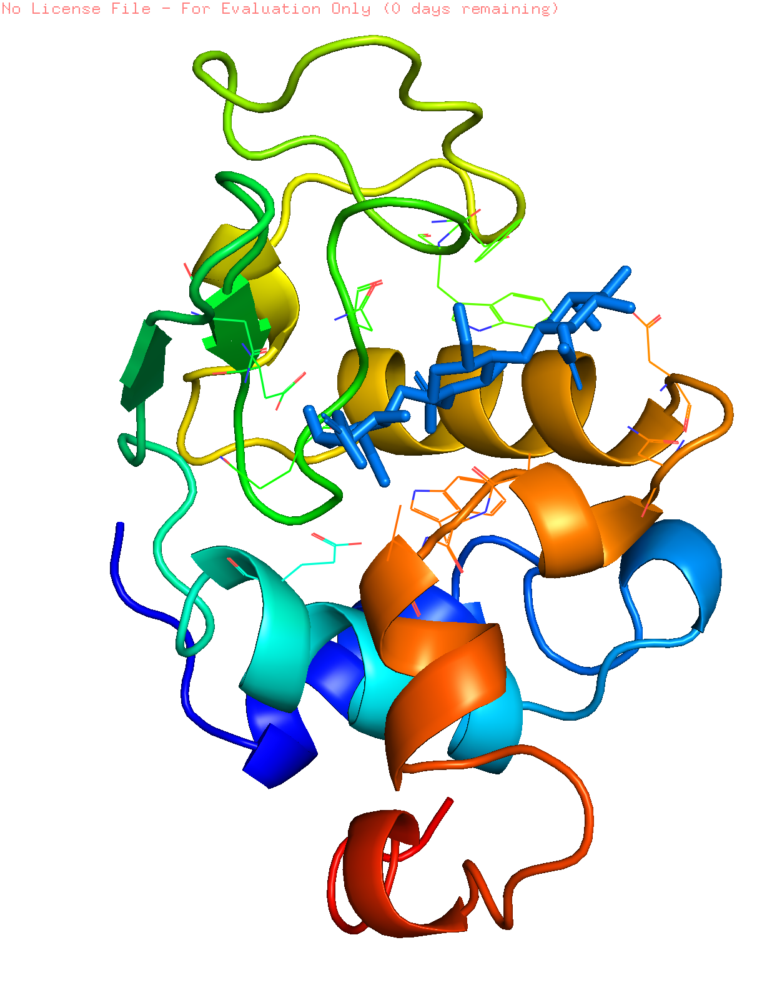

In [ ]:
select contacts_4, byres prot within 4 of ligand
show lines, contacts_4

distance hidrbond_4, contacts_4, ligand, 4, 2
set dash_color, palecyan

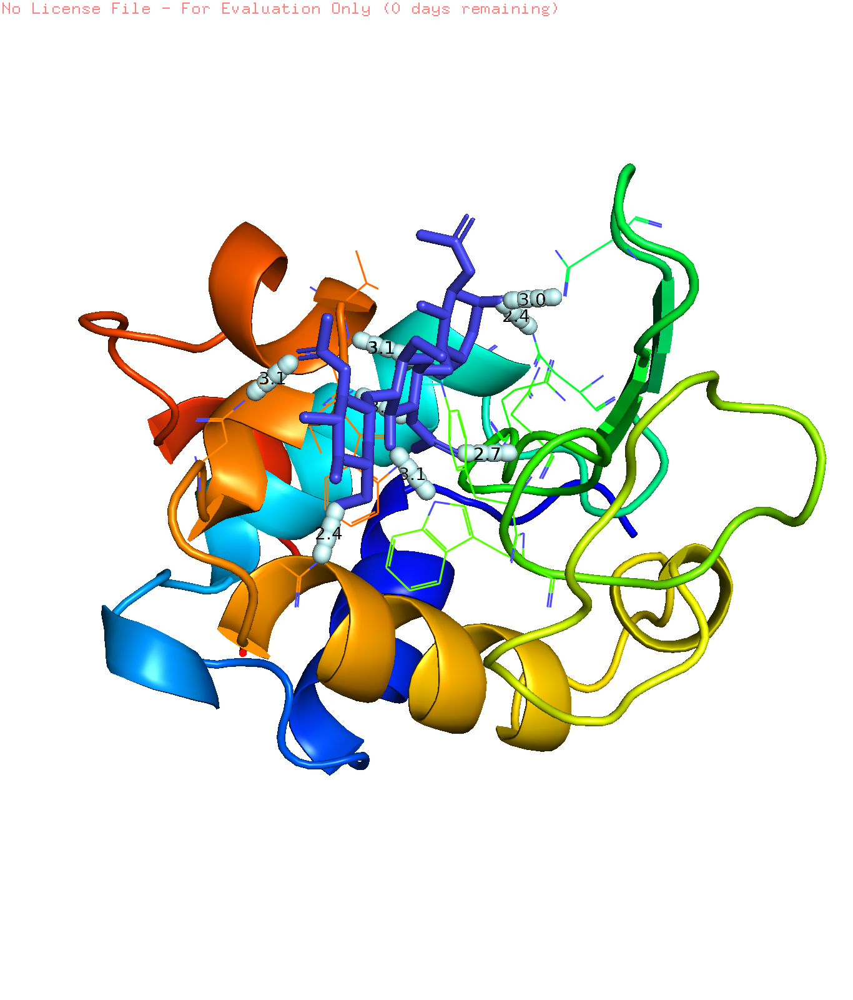

Поствыис 4 вместо традиционных 3.2 порог для длины связм, повторим тот же набор опираций и пострим на результат.

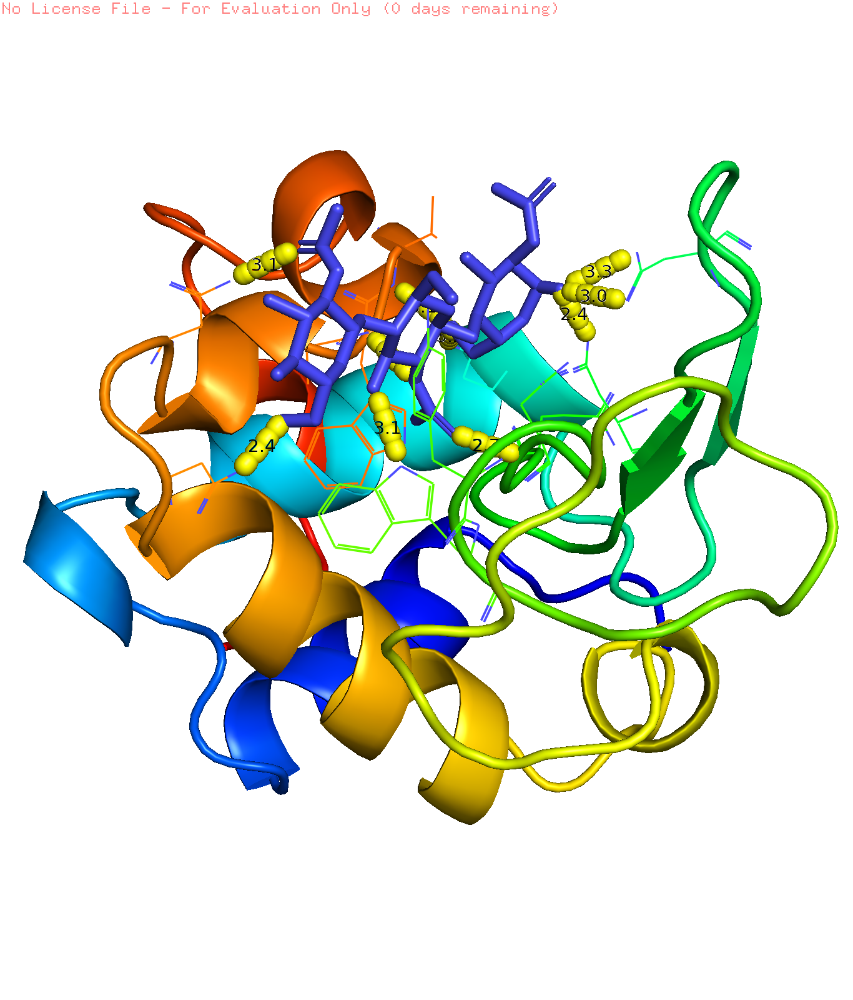

Также можем воспользоваться командой show surface

In [ ]:
show surface

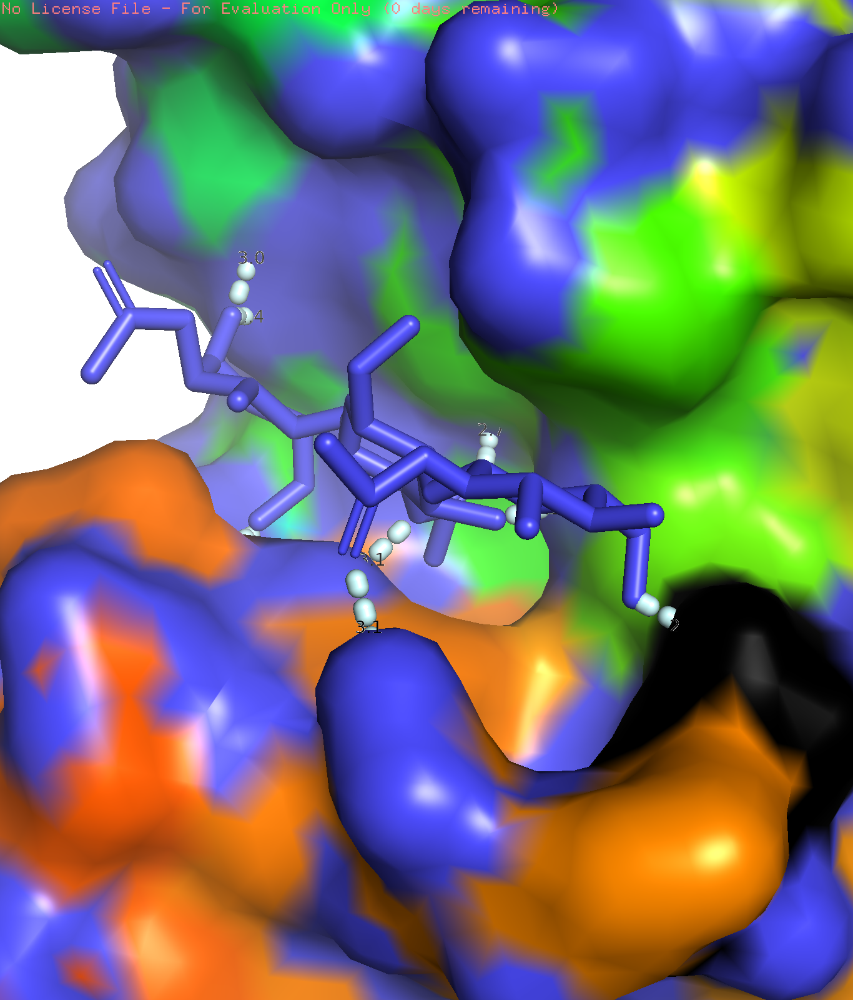

## 3. Средствами Tcl/Tk интерфейса Wizard->Mutagenesis проведите мутацию в белке, которая по вашему мнению должна привести к потере связывания с лигандом.

In [ ]:
python 

reinitialize
fetch 1lmp

extract water, resn HOH
delete water

cmd.wizard("mutagenesis")
cmd.do("refresh_wizard")
cmd.get_wizard().set_mode("VAL")
cmd.get_wizard().do_select("/1lmp//A/ASP`101")

cmd.frame(1)
cmd.get_wizard().apply()
cmd.wizard(None)
extract ligand, het

fetch 1lmp, 1lmp_mutated
color marine, 1lmp_mutated
color tv_yellow, 1lmp
color gray90, ligand

python end

Заменим 101 остаток ASP на Val в качестве мутации близкого к лиганду аминокислату.

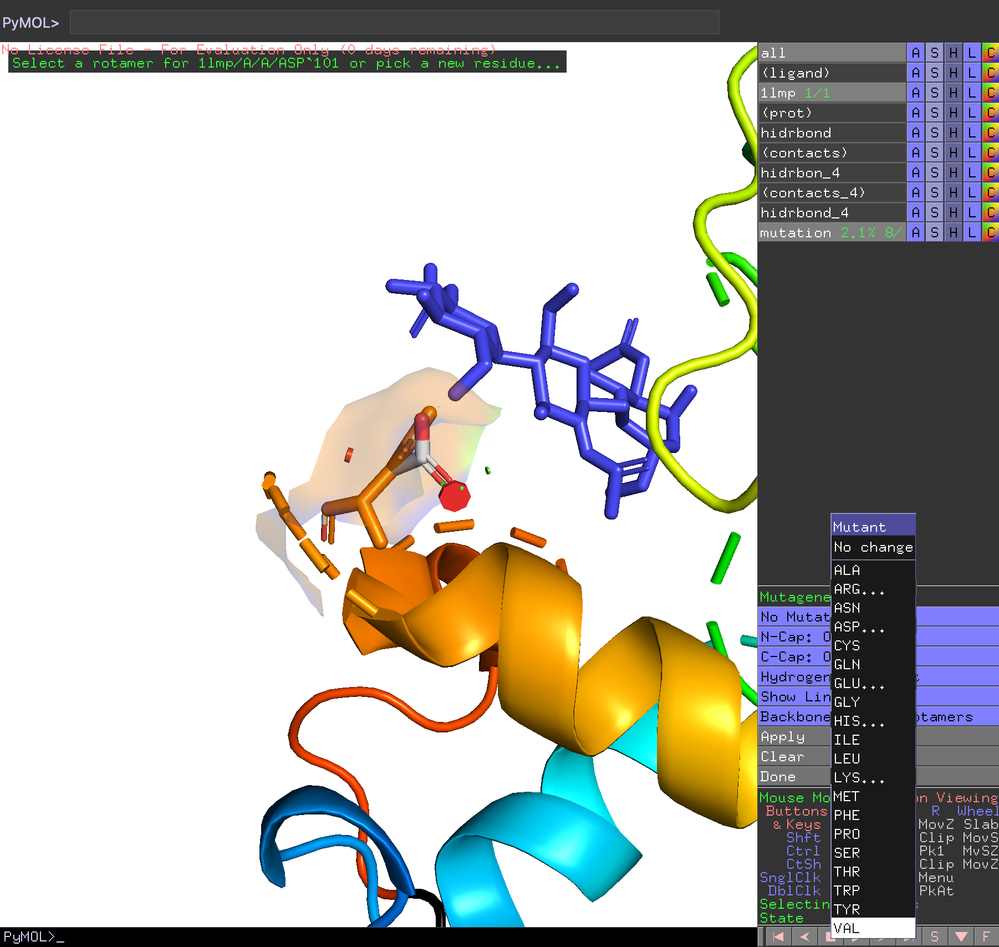

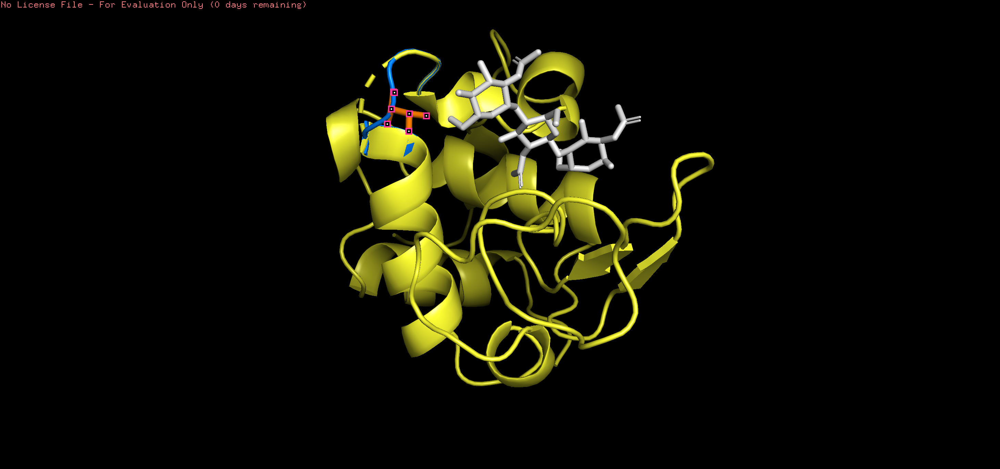

4. Используя команды mset, mview, super, translate создайте анимационный ролик mpeg где происходит совмещение белков и показывается место мутации. Обратите внимание на указания в object motions на http://www.pymolwiki.org pymolwiki.


In [ ]:
python 

reinitialize
fetch 1lmp

cmd.wizard("mutagenesis")
cmd.do("refresh_wizard")
cmd.get_wizard().set_mode("VAL")
cmd.get_wizard().do_select("/1lmp//A/ASP`101")

cmd.frame(1)
cmd.get_wizard().apply()
cmd.wizard(None)
extract ligand, het

fetch 1lmp, 1lmp_mutated
color marine, 1lmp_mutated
color tv_yellow, 1lmp
color gray90, ligand


as sticks, 1lmp_mutated
as sticks, 1lmp
as sticks, ligand

show stick, resi 101
zoom all
center all

set matrix_mode, 1
set movie_panel, 1
set cache_frames, 1
mset 1-180

frame 1
translate [60, 0, 0], object=1lmp_mutated 
mview store                     
mview store, object=1lmp_mutated         
mview store, object=1lmp

frame 80                        
translate [-60, 0, 0], object=1lmp_mutated 
mview store                     
mview store, object=1lmp_mutated         
mview store, object=1lmp        
mview interpolate, object=1lmp_mutated 

frame 160                      
orient resi 101                        
mview store                     
mview store, object=1lmp   
mview store, object=1lmp_mutated         

frame 240                       
orient resi 101                                      
mview store                     
mview store, object=1lmp
mview store, object=1lmp_mutated          

mplay

python end


# [Ссылка на построенный видео ролик](https://youtu.be/1epB-6jgGLI)
https://youtu.be/1epB-6jgGLI


## 5. Приседените флуорусцентную метку TAMRA к белку через сложноэфирную связь. Используйте команды fuse и torsion.

load tamra.sdf

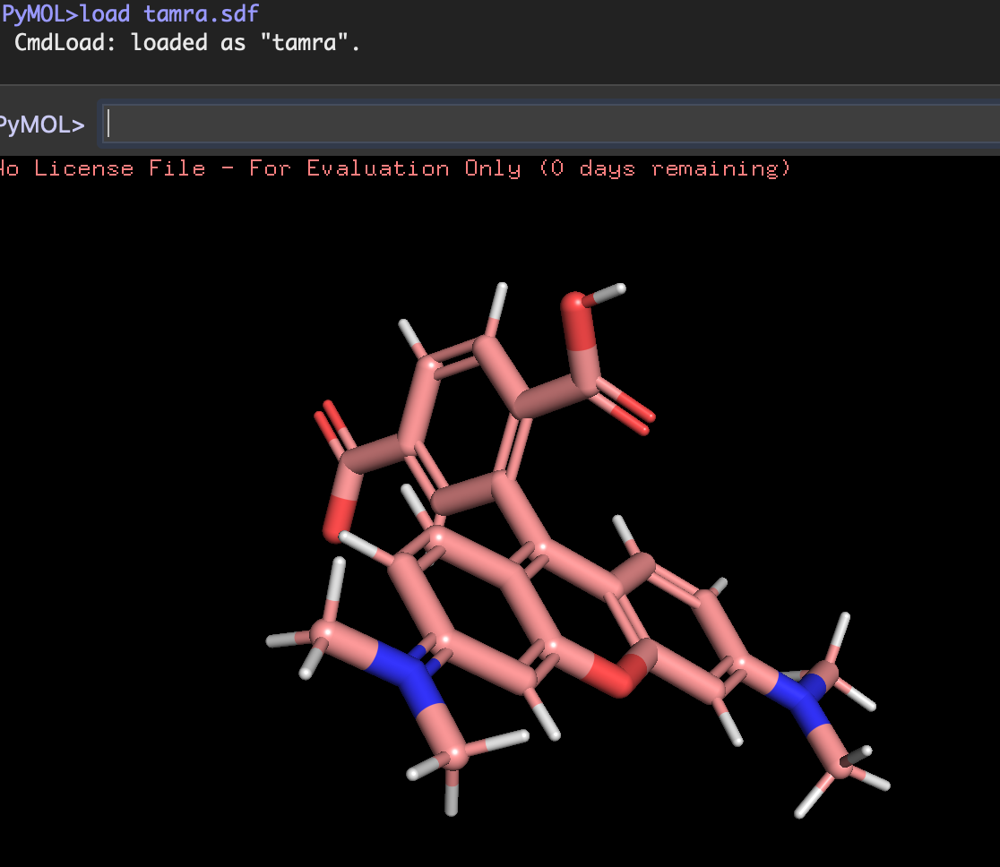

In [ ]:
fuse /1lmp//A/SER`32/OG , /tamra///UNK`0/O


И раскрасим их

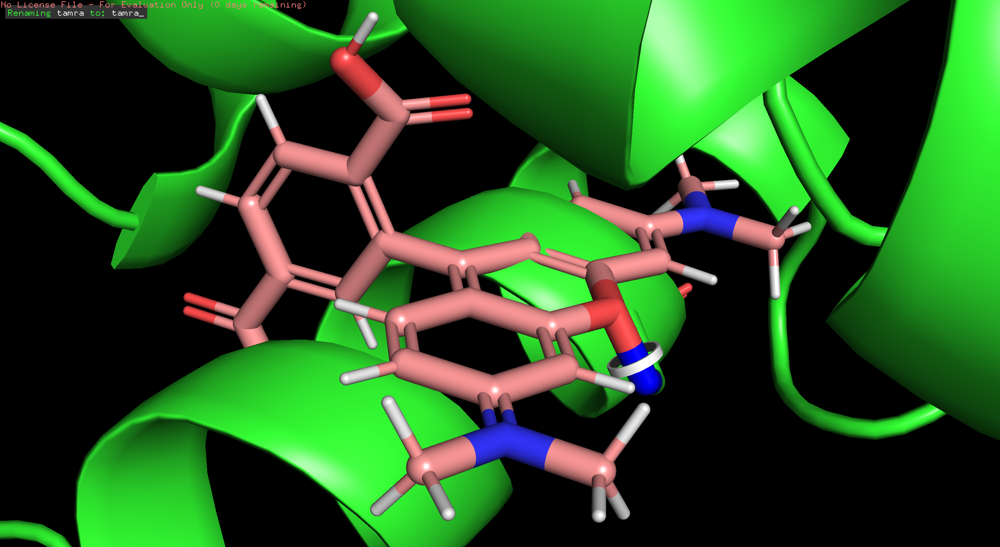

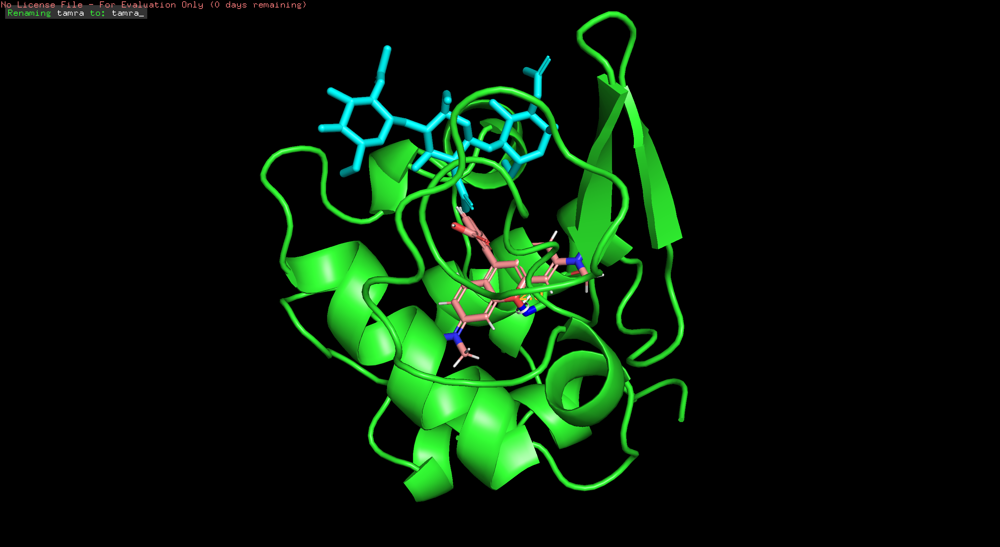

## 6. Напишите скрипт для построения поли-аланиновой ( Вы вольны использовать любую аминоксилоту) альфа спирали длинной 100 аминкислот. Псевдо-код вы можете найти в подсказках.


In [ ]:
Код из подсказки:

mset
frag ala
python 
for x in range(1,25):
     cmd.edit(atom)
     editor.attach_amino_acid("pk1","ala")
     cmd.edit(bond) e.g. atom1,atom2
     cmd.torsion phi
     cmd.edit(bond) e.g. atom1,atom2
     cmd.torsion psi
python end


По аналогии сделаем:
И зафиксируес углы фи - 60 и и пси - 45

python 
cmd.reinitialize()
n = 100
cmd.fragment('ala')
for i in range(2, n + 1):
    cmd.edit(f'resi {i} and name C')
    cmd.editor.attach_amino_acid("pk1", AA)
    cmd.set_dihedral(f"resi {i} & name N", f"resi {i} & name CA",
                     f"resi {i} & name C", f"resi {i+1} & name n",  -60)
    cmd.set_dihedral(f"resi {i} & name C", f"resi {i+1} & name n",
                     f"resi {i+1} & name CA", f"resi {i} & name C", -45)
python end



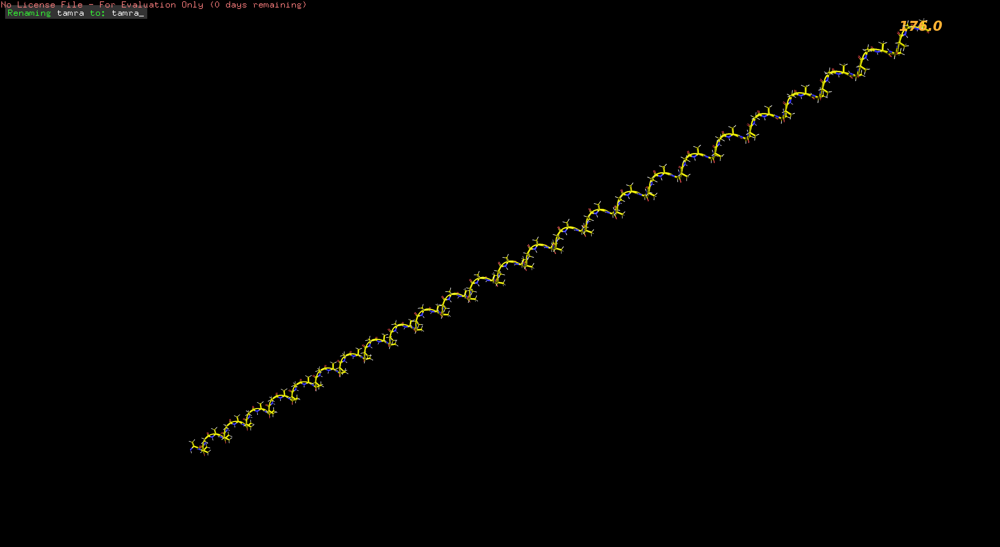

Если зафиксируем углы фи - 70 и и пси - 35, то получаем:

In [ ]:
python 
cmd.reinitialize()
n = 100
cmd.fragment('ala')
for i in range(2, n + 1):
    cmd.edit(f'resi {i} and name C')
    cmd.editor.attach_amino_acid("pk1", AA)
    cmd.set_dihedral(f"resi {i} & name N", f"resi {i} & name CA",
                     f"resi {i} & name C", f"resi {i+1} & name n",  -70)
    cmd.set_dihedral(f"resi {i} & name C", f"resi {i+1} & name n",
                     f"resi {i+1} & name CA", f"resi {i} & name C", -35)
python end

zoom  /ala///ALA`53/CB

И раскрасим в радужные цвета:

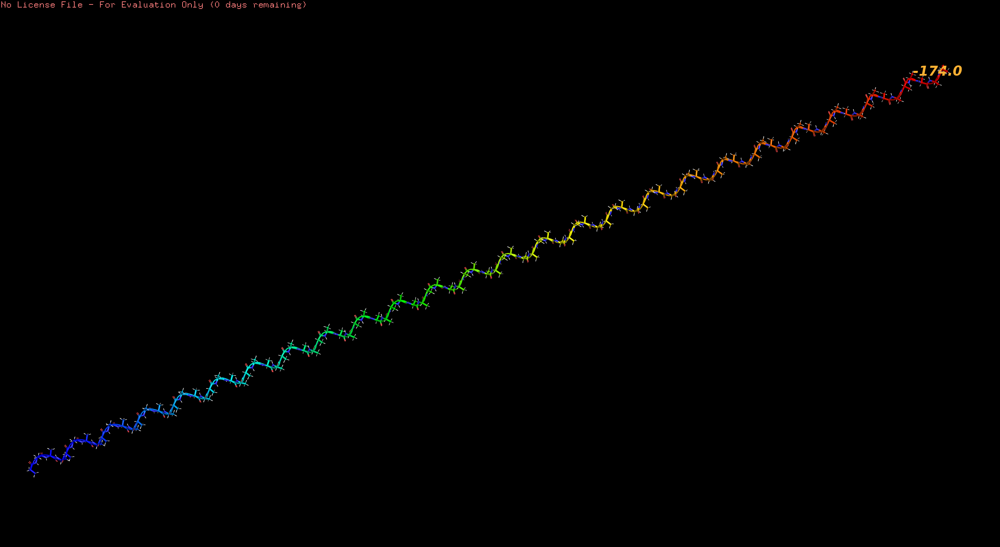

* Напишите скрипт для построения G-квадруплексной ДНК (pdbid: 2mb2) длинной 100 пар нуклеотидов. Здесь есть проблемы, так заготовок для нуклеиновых кислот нет. Суть подхода состоит в определении матрицы превращения при совмещении одной пары нуклеотидов с последующей. После чего выможете размножать эту пару и применять к ней матрицу превращения. Примерный код и ссылки Вы сможете найти в подсказках.

In [ ]:
Псевдокод из подсказки:

fetch perfectdna
create pair
create nextpair 
create 1, pair
python
cmd.pair_fit("pair","nextpair")
trans=cmd.get_object_matrix("pair")
for x in range(2,500):
    cmd.create x,x-1 
    cmd.transform_selection( str(x), trans, homogenous=0 );
python end

In [ ]:


reinitialize

fetch 2mb2
show cartoon

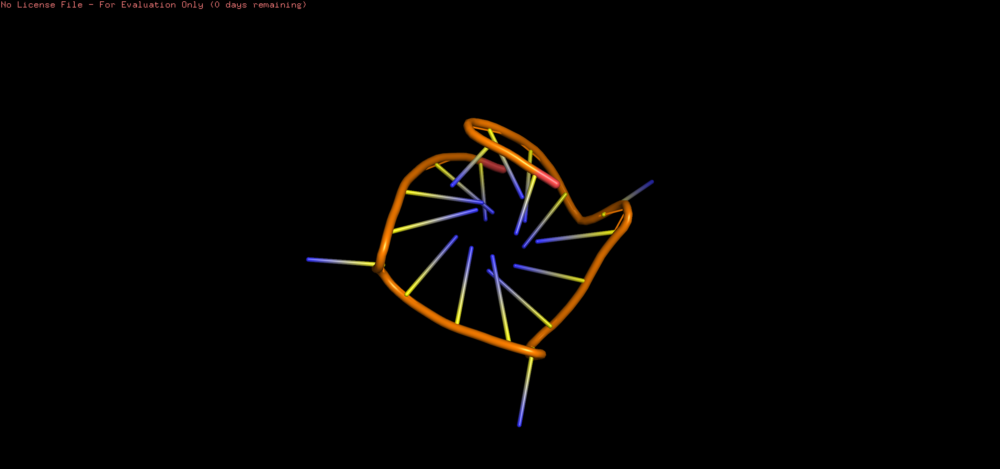

In [ ]:


reinitialize

fetch 2mb2
show cartoon



pair1, pair2 -- выделаем участики находящие над друг другом и называем их pair1, pair2
pair_fit pair1, pair2



python
transformation = cmd.get_object_matrix("pair1")
for x in range(2, 100):
    cmd.create(str(x), str(x-1))
    cmd.do('cmd.transform_selection(%i, %s, homogenous=0)' % (x, transformation))
    
python end 

Цетр ставим селектом ближе к середине и получаем:

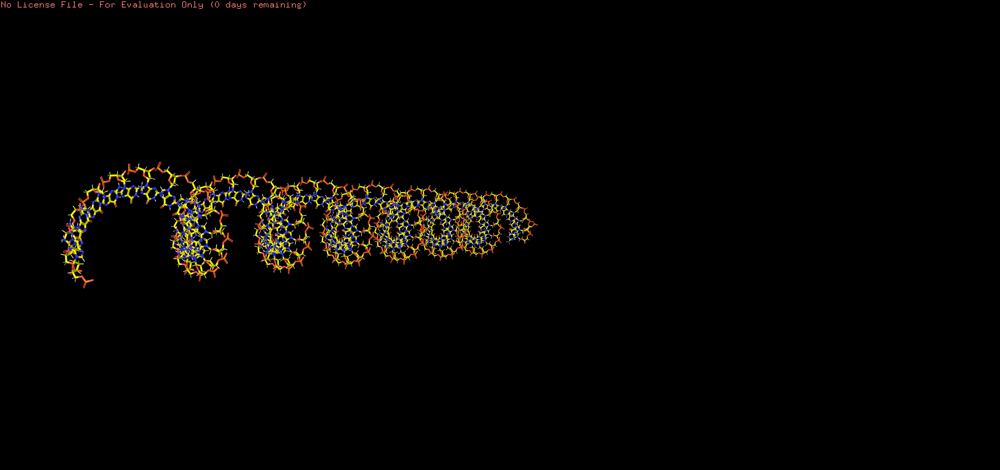

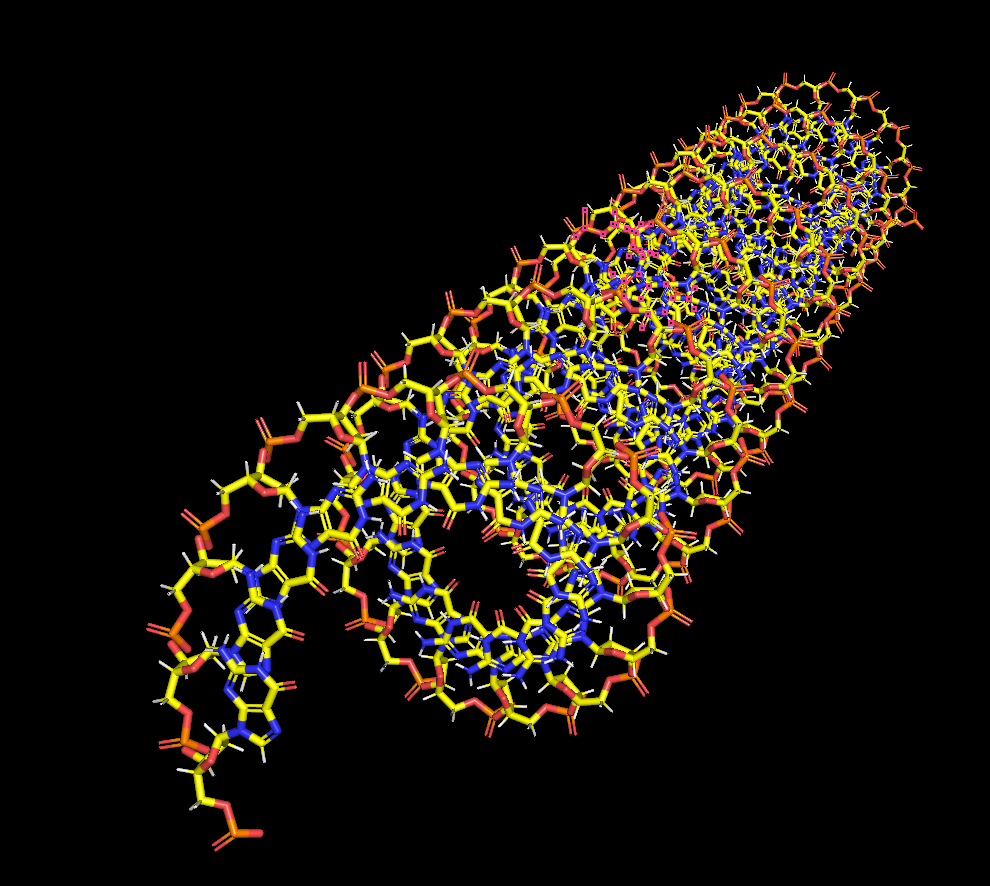